In [73]:
import transformers
import datasets
import shap
from shap.plots import *
import csv
import nltk
import re, string
import pandas as pd
import numpy as np
from nltk.tokenize import word_tokenize
from collections import Counter
%matplotlib inline
from plotly import graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
import datetime
import torch
import random
from PIL import Image


In [74]:
def clean_text(text):
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('\'','', text)
    
    return text

In [130]:
# convert date from string to datetime object
def datte():
    for i in range(len(train)):
        train['date'][i] = datetime.datetime.strptime(train['date'][i], '%Y-%m-%d %H:%M:%S')
        
# select n random tweets from start date to end date
def choose_tweets_from_date(start, end, n):
    start = datetime.datetime.strptime(start, '%Y-%m-%d')
    end = datetime.datetime.strptime(end, '%Y-%m-%d')
    choices = []
    for i in range(len(train)):
        if start <= train['date'][i] <= end:
#             el = []
#             el.append([train['content'][i], i])
#             choices.append(el)
            el = train['content'][i]
            choices.append(el)
        
    
#     chosen = []
#     chosen.append(random.sample(choices, n))
    chosen=random.sample(choices, n)

    return chosen

In [126]:
train = pd.read_csv('WFiIS-MIO-main/datasets/realdonaldtrump.csv')
train = train.drop(['link', 'retweets', 'favorites', 'mentions', 'hashtags'], axis=1)

train['content'] = train['content'].map(lambda x: re.sub(r'@\w+\s', ' ', x))
train['content'] = train['content'].map(lambda x: re.sub(r'https?://\S+|www\.\S+', '', x))
train['content'] = train['content'].map(lambda x: re.sub(r'\W+', ' ', x))
train['content'] = train['content'].replace(r'\W+', ' ', regex=True)
train['content'] = train['content'].apply(lambda x:clean_text(x))
train['token'] = train['content'].apply(lambda x:word_tokenize(x))
train['text'] = train['token'].apply(lambda x: ' '.join([word for word in x if len(word)>2]))
datte()


In [131]:
n = 50
before = choose_tweets_from_date('2011-01-01', '2017-01-19', n)
after = choose_tweets_from_date('2017-01-20', '2021-01-20', n)
before

['it s wednesday i wonder how much money barackobama borrowed from china today ',
 ' nicolasfje realdonaldtrump yesterday i went to your hotel trumppanama it was spectacular thank you ',
 ' socialists think profits are a vice i consider losses the real vice winston churchill',
 'discipline is a key ingredient for success it will build character motivation and bring opportunity ',
 'many great business campaigns at fundanything great way to support small upstarts ',
 'sorry couldn t do foxandfriends this morning big meeting will double up next week at  ',
 'thank you to foxandfriends for the great review of the speech on immigration last night thank you also to the great people of arizona ',
 'great honor rev jerry falwell jr of liberty university one of the most respected religious leaders in our nation has just endorsed me ',
 ' andybran foxandfriends all of the clinton graft is uncovered by a writer no agency tracks this type of theft out of control ',
 ' pepsidaisy realdonaldtrump  

In [78]:
top = Counter([item for sublist in train['token'] for item in sublist])
temp = pd.DataFrame(top.most_common(20))
temp.columns = ['Common_words','count']
temp.style.background_gradient(cmap='Blues')


,Common_words,count
0,the,34657
1,to,19801
2,and,15928
3,a,15491
4,of,13345
5,is,12886
6,in,11942
7,i,10795
8,you,10716
9,for,9991


In [79]:
fig = px.bar(temp, x="count", y="Common_words", title='Common Words in Selected Text', orientation='h', 
          width=700, height=700,color='Common_words')
fig.show()

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english)
  0%|                                                                                          | 0/248 [00:00<?, ?it/s]


 85%|██████████████████████████████████████████████████████████████████▋           | 212/248 [00:00<00:00, 1300.59it/s]
Partition explainer: 51it [04:57,  6.08s/it]                                                                           
C:\Users\mrsaf\PycharmProjects\shapProjekt\WFiIS-MIO-main\env\lib\site-packages\slicer\slicer_internal.py:443: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



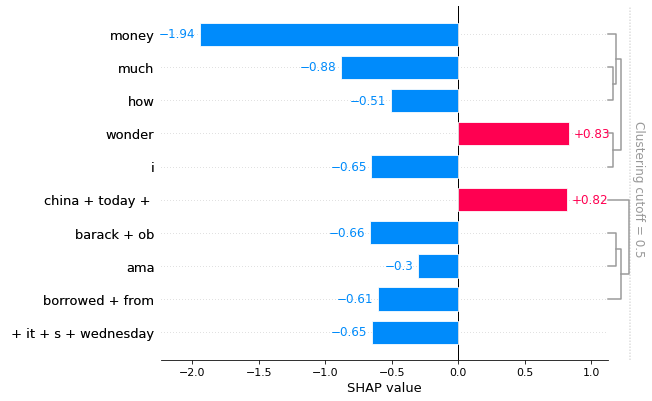

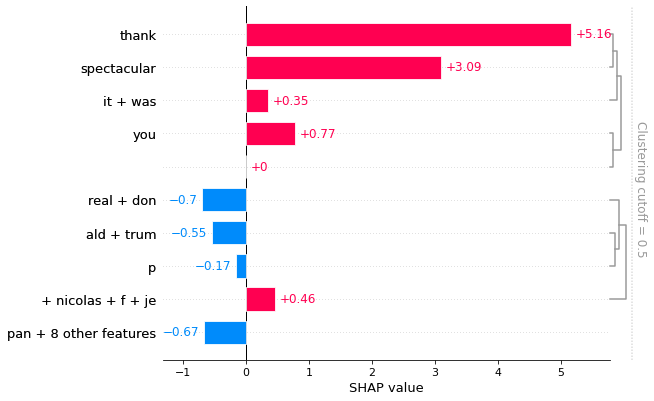

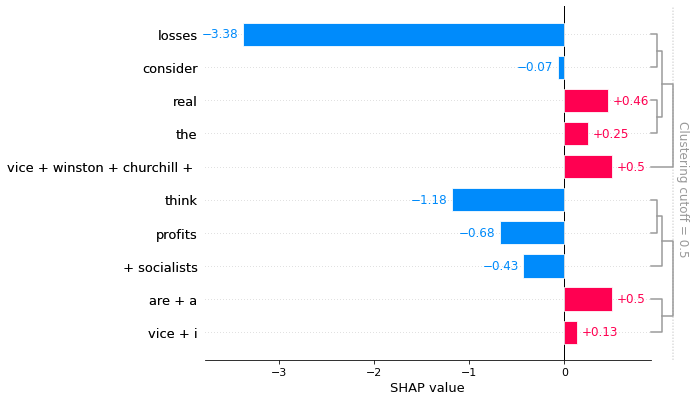

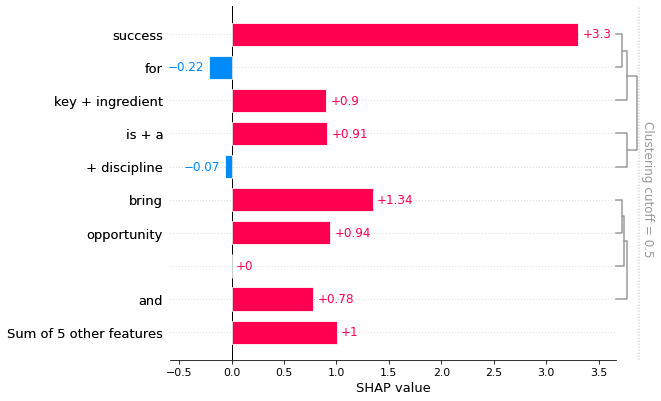

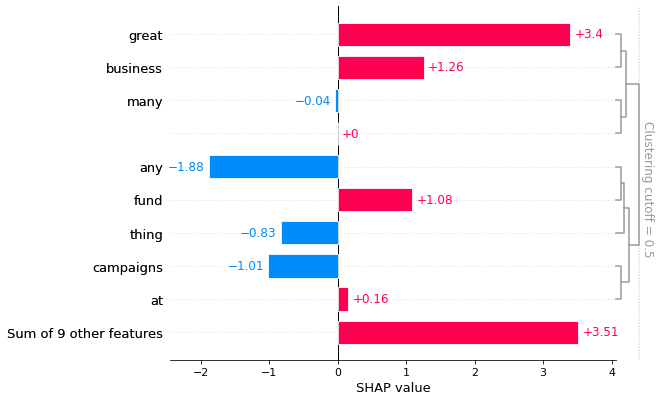

...

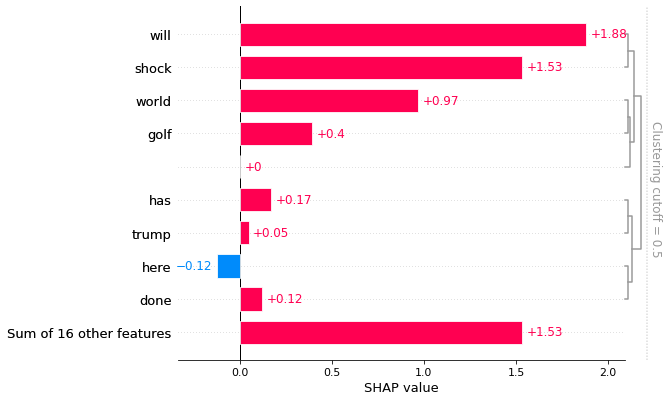

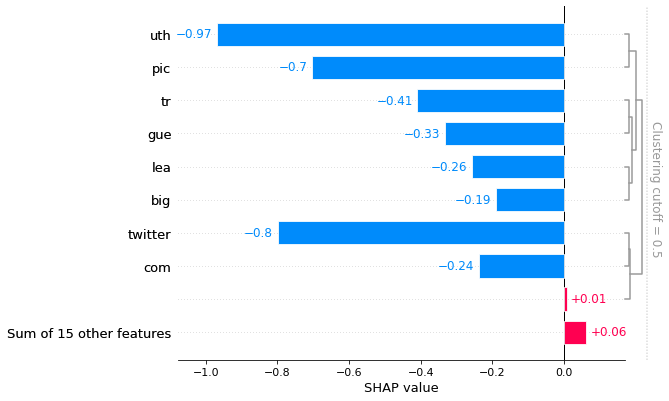

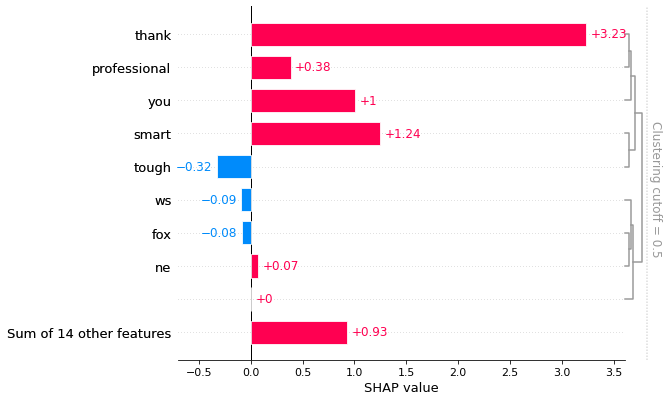

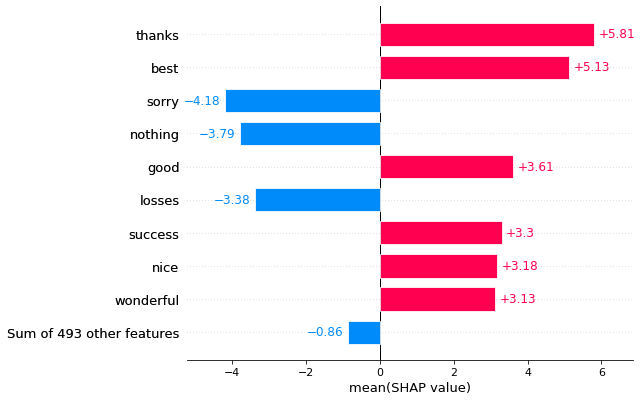

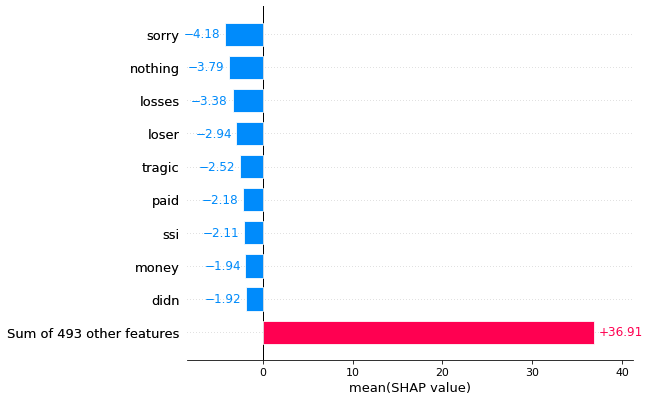

In [132]:

classifier = transformers.pipeline('sentiment-analysis', return_all_scores=True)
classifier(before)

pmodel = shap.models.TransformersPipeline(classifier, rescale_to_logits=True) 

explainer2 = shap.Explainer(pmodel)
shap_values = explainer2(before)
shap.plots.text(shap_values[:,:,1])

for i in range(n):
    shap.plots.bar(shap_values[i, :,"POSITIVE"])
shap.plots.bar(shap_values[:, :, "POSITIVE"].mean(0))
shap.plots.bar(shap_values[:, :, "POSITIVE"].mean(0), order=shap.Explanation.argsort)



No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english)


-0.04369382860839609


100%|████████████████████████████████████████████████████████████████████████████████| 248/248 [00:05<00:00, 31.65it/s]
254it [00:05, 30.73it/s]                                                                                               
 69%|██████████████████████████████████████████████████████▏                        | 170/248 [00:00<00:00, 805.66it/s]
254it [00:02, 70.84it/s]                                                                                               
100%|████████████████████████████████████████████████████████████████████████████████| 248/248 [00:06<00:00, 23.66it/s]
254it [00:06, 23.93it/s]                                                                                               
100%|████████████████████████████████████████████████████████████████████████████████| 248/248 [00:06<00:00, 24.48it/s]
254it [00:06, 23.61it/s]                                                                                               
  0%|                                   

 90%|████████████████████████████████████████████████████████████████████████▎       | 224/248 [00:02<00:00, 67.54it/s]
254it [00:03, 53.04it/s]                                                                                               
100%|████████████████████████████████████████████████████████████████████████████████| 248/248 [00:06<00:00, 20.82it/s]
254it [00:07, 21.22it/s]                                                                                               
100%|████████████████████████████████████████████████████████████████████████████████| 248/248 [00:06<00:00, 28.94it/s]
254it [00:06, 27.38it/s]                                                                                               
100%|████████████████████████████████████████████████████████████████████████████████| 248/248 [00:06<00:00, 22.68it/s]
254it [00:06, 22.30it/s]                                                                                               
 88%|███████████████████████████████████

100%|████████████████████████████████████████████████████████████████████████████████| 248/248 [00:07<00:00, 20.82it/s]
254it [00:07, 20.39it/s]                                                                                               
100%|████████████████████████████████████████████████████████████████████████████████| 248/248 [00:05<00:00, 31.19it/s]
254it [00:05, 29.96it/s]                                                                                               
100%|████████████████████████████████████████████████████████████████████████████████| 248/248 [00:06<00:00, 23.84it/s]
254it [00:06, 23.37it/s]                                                                                               
  0%|                                                                                          | 0/248 [00:00<?, ?it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 248/248 [00:06<00:00, 24.90it/s]
254it [00:06, 23.86it/s]                                                                                               
 69%|██████████████████████████████████████████████████████▏                        | 170/248 [00:00<00:00, 809.52it/s]
254it [00:02, 73.90it/s]                                                                                               
100%|████████████████████████████████████████████████████████████████████████████████| 248/248 [00:06<00:00, 21.74it/s]
254it [00:06, 21.18it/s]                                                                                               
 81%|██████████████████████████████████████████████████████████████▉               | 200/248 [00:00<00:00, 1136.28it/s]
Partition explainer: 51it [06:11,  7.58s/it]                                                                           


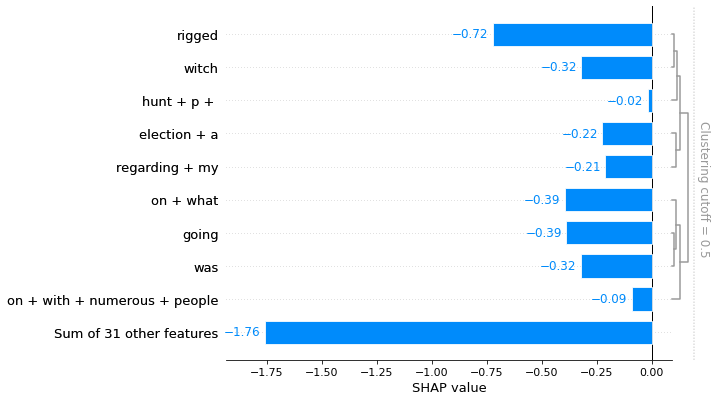

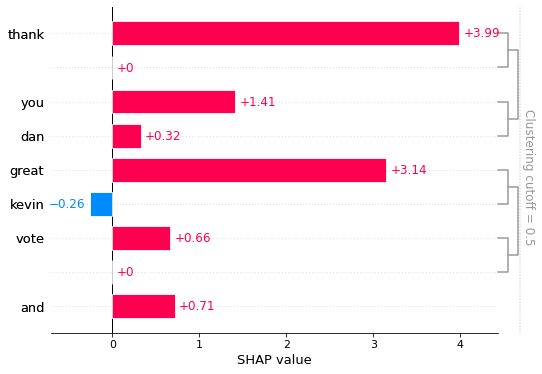

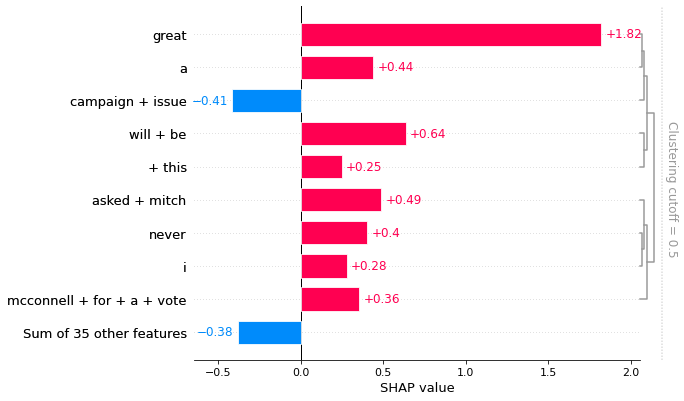

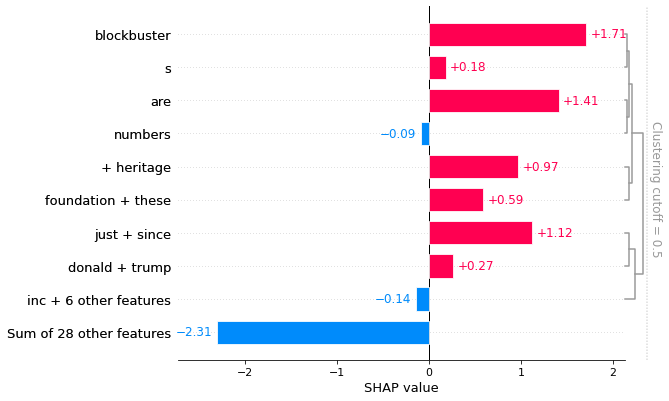

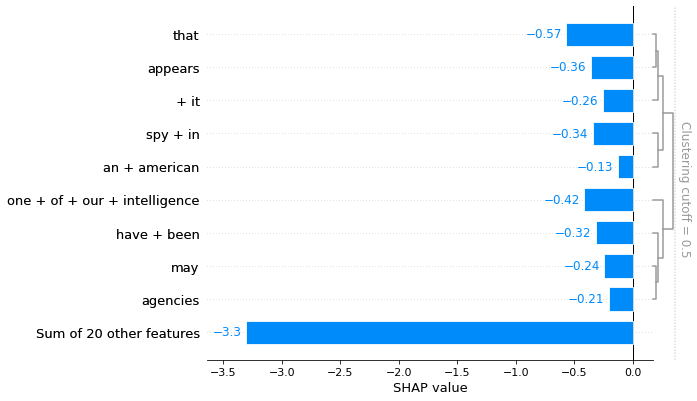

...

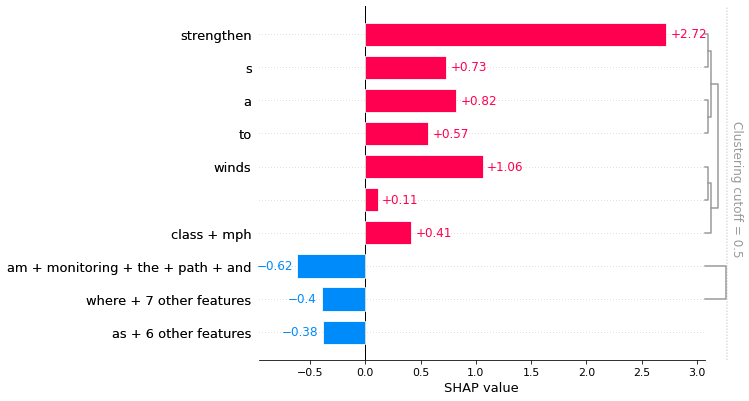

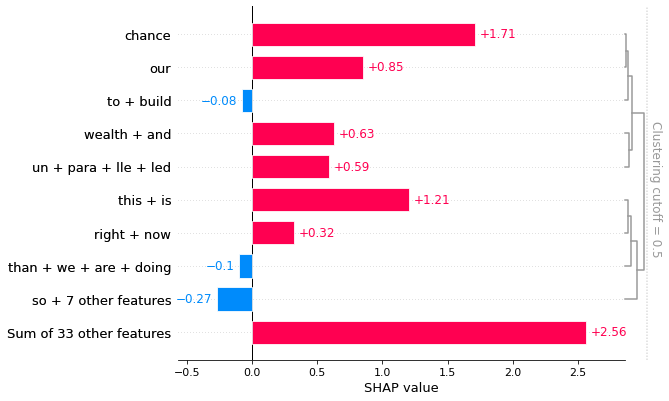

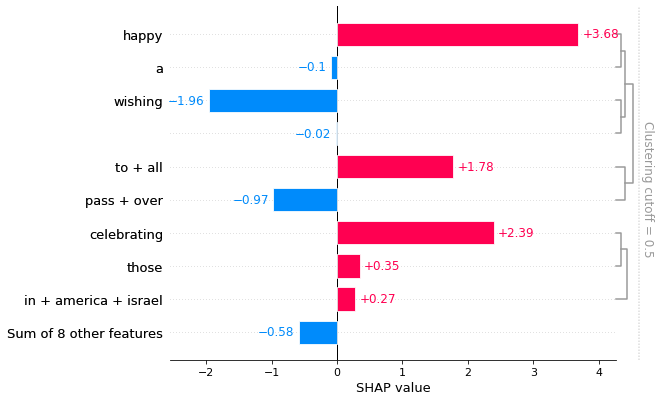

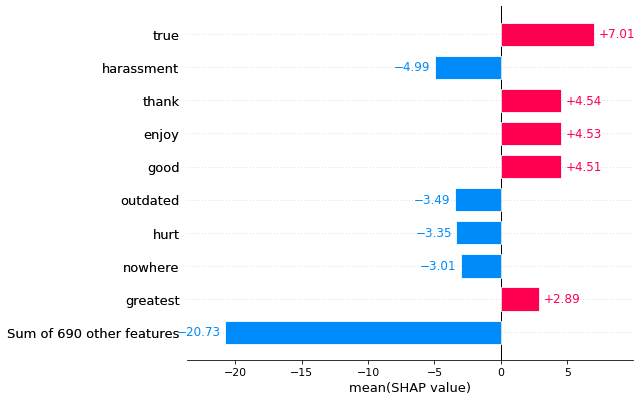

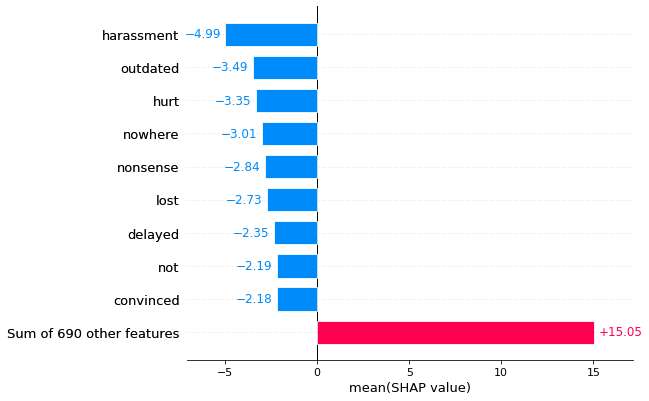

In [133]:
average_before = sum(shap_values[:, :, "POSITIVE"].mean(0).values)/len(shap_values[:, :, "POSITIVE"].mean(0).values)
print(average)

classifier = transformers.pipeline('sentiment-analysis', return_all_scores=True)
classifier(after)

pmodel = shap.models.TransformersPipeline(classifier, rescale_to_logits=True)

explainer2 = shap.Explainer(pmodel)
shap_values = explainer2(after)
shap.plots.text(shap_values[:,:,1])

for i in range(n):
    shap.plots.bar(shap_values[i, :,"POSITIVE"])
shap.plots.bar(shap_values[:, :, "POSITIVE"].mean(0))
shap.plots.bar(shap_values[:, :, "POSITIVE"].mean(0), order=shap.Explanation.argsort)

In [134]:
average_after = sum(shap_values[:, :, "POSITIVE"].mean(0).values)/len(shap_values[:, :, "POSITIVE"].mean(0).values)
print(average)

average_before
average_after

-0.04369382860839609


-0.01727848837024183

In [135]:
negative, positive = np.zeros((train.shape[0], 1)), np.zeros((train.shape[0], 1))

In [136]:
for i, tweet in enumerate(before):
    output = classifier(tweet)
    score = output[0][0].detach().numpy()
    scores = softmax(score)
    negative[i] = scores[0]
    positive[i] = scores[2]

train['Negative'] = negative
train['Positive'] = positive

AttributeError: 'dict' object has no attribute 'detach'

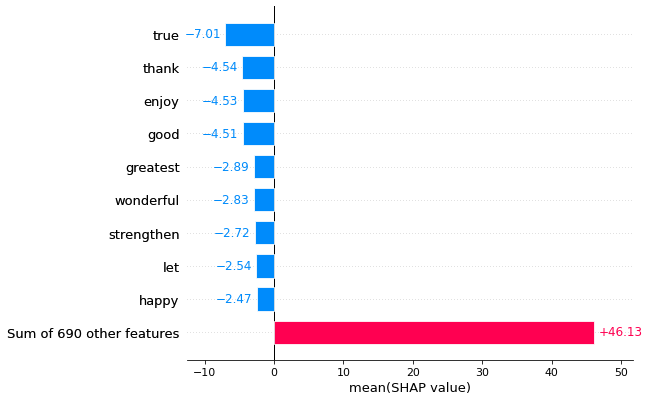

In [137]:
shap.plots.bar(shap_values[:, :, "NEGATIVE"].mean(0), order=shap.Explanation.argsort)